# Assignment 1

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

------

# Solution

In this first cell of code, we import the necessary libraries and create the data structures that are used for easier loading and indexing of the images.

In [1]:

import cv2
import numpy as np
import random
import os
import matplotlib.pyplot as plt

seed = 42

sid_models = [f"ref{i}" for i in range(1, 15)]
sid_scenes = [f"scene{i}" for i in range(1, 6)]

mid_models = [f"ref{i}" for i in range(15, 28)]
mid_scenes = [f"scene{i}" for i in range(6, 13)]

def load_images_from_folder(folder):
    images = {os.path.splitext(filename)[0]:cv2.cvtColor(cv2.imread(os.path.join(folder, filename)), cv2.COLOR_BGR2RGB) for filename in os.listdir(folder)}
    return images

def load_images_from_keys(images: dict, keys: list):
    return [images.get(key, default = None) for key in keys]

scenes = load_images_from_folder("./dataset/scenes")
models = load_images_from_folder("./dataset/models")

After examining the dataset, we can see how the scene images indeed show a lot of noise. As such, images need to be filtered first before being used for the instance detection tasks.
We choose to apply a **Median filter**, followed by a **Bilateral filter**, to denoise the scenes, in order to decrease both the impulse noise and the Gaussian noise. At the same time, this pipeline also does a pretty good job at preserving the edges.

In [2]:
def imageFilteringPipeline(image, median_size = 5, bilateral_size = 9, sigmaC = 25, sigmaS = 15):
    image = cv2.medianBlur(image, median_size)
    image = cv2.bilateralFilter(image, bilateral_size, sigmaColor = sigmaC, sigmaSpace = sigmaS)

    return image

In [3]:
single_instance_truths = {
    "scene1": ["ref1", "ref2"],
    "scene2": ["ref3", "ref4", "ref5"],
    "scene3": ["ref6", "ref7", "ref8"],
    "scene4": ["ref1", "ref7", "ref8", "ref9", "ref10"],
    "scene5": ["ref11", "ref12"]
}

multi_instance_truths = {
    "scene6": { "ref15": 2 },
    "scene7": { "ref16": 2 },
    "scene8": { "ref17": 2, "ref23": 2, "ref24": 1, "ref27": 1 },
    "scene9": { "ref18": 2, "ref19": 2, "ref20": 2 },
    "scene10": { "ref21": 2, "ref22": 2 },
    "scene11": { "ref17": 2, "ref23": 2, "ref24": 2, "ref25": 3 },
    "scene12": { "ref26": 2, "ref27": 2, "ref18": 2 }
}

In [4]:
sift = cv2.SIFT_create()

The following functions are mostly for debugging purposes and can be safely be ignored.

In [5]:
def draw_matches(image1, keypoints1, image2, keypoints2, matches):
    matched_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, matches, None, singlePointColor=(255, 0, 255), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
    return matched_image

def draw_bb(source_image, bb_pts):
    # draw bb corners on the image as circles
    for i in np.array(np.int32(bb_pts)).reshape(-1, 2):
        cv2.circle(source_image, (i[0], i[1]), 10, (255, 0, 255), 4)

    # draw bb on the source image
    _ = cv2.polylines(source_image,[np.int32(bb_pts)],True,255,3, cv2.LINE_AA)

def draw_matched_keypoints(model_image, scene_image, kp_query, kp_train, good_matches):
    """
    Draws only the matched keypoints as filled red dots on the images.
    """
    model_image_copy = model_image.copy()
    scene_image_copy = scene_image.copy()

    color = (255, 0, 0)

    # draw matched keypoints on the model image
    for match in good_matches:
        query_idx = match.queryIdx
        x, y = kp_query[query_idx].pt
        cv2.circle(model_image_copy, (int(x), int(y)), 5, color, -1)

    # draw matched keypoints on the scene image
    for match in good_matches:
        train_idx = match.trainIdx
        x, y = kp_train[train_idx].pt
        cv2.circle(scene_image_copy, (int(x), int(y)), 5, color, -1)

    return model_image_copy, scene_image_copy

### Bounding Box functions
These functions are dedicated to **building the bounding boxes** of the products found in the target image. In particular:
- `build_bb` searches for an homography of the template image into the target image, then apply the necessary transformations for making it valid, which are explained in the following functions.
- `bb_sanity_check` checks if a BB is valid, by making sure that it's not malformed and not too small (its diagonals  and edges must be larger than `BB_VALID_SIZE`)
- `force_rectangle` forces the BB to be a rectangle by computing the average of coordinates on the same edge.
- `correct_for_boundaries` simply clamps the edges if the BB is out of image bounds.


In [6]:
BB_VALID_SIZE = 100

def bb_sanity_check(bb) :
    """
    Checks if a BB is valid
    """
    points = np.array(bb).reshape(-1, 2)

    # checks if length btwn 1st and 2nd point
    # and height btwn 1st and 3rd must be more than BB_VALID_SIZE
    check_poly_edges = (points[2, 0] - points[0, 0]) > BB_VALID_SIZE \
        and (points[1, 1] - points[0, 1]) > BB_VALID_SIZE

    min_x = np.min(points[:, 0])
    max_x = np.max(points[:, 0])
    min_y = np.min(points[:, 1])
    max_y = np.max(points[:, 1])

    top_left = [min_x, min_y]
    bottom_right = [max_x, max_y]

    # then check diagonal
    check = ((bottom_right[0] - top_left[0]) > BB_VALID_SIZE
            and (bottom_right[1] - top_left[1]) > BB_VALID_SIZE) \
            and check_poly_edges

    return check

def build_bb(imgModel, imgScene, kpModel, kpScenes, good_matches, verbose=True):
    """
    Returns a bounding box of the template's homography on the target in the scene.
    """
    if len(good_matches) < 4:
        if verbose: print("--- WARNING: Not enough matches to compute homography (need at least 4) ---")
        return None, None

    model_pts = np.float32([kpModel[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    scene_pts = np.float32([kpScenes[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    # find the homography of the template on the scene
    homography, mask = cv2.findHomography(model_pts, scene_pts, cv2.RANSAC, ransacReprojThreshold=5.0)

    h, w, _ = imgModel.shape
    corner_pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)

    if homography is not None:
        # filter matches to keep only inliers
        inlier_matches = [good_matches[i] for i in range(len(mask)) if mask[i]]

        # recompute model_pts and scene_pts using only inliers
        model_pts_inliers = np.float32([kpModel[m.queryIdx].pt for m in inlier_matches]).reshape(-1, 1, 2)
        scene_pts_inliers = np.float32([kpScenes[m.trainIdx].pt for m in inlier_matches]).reshape(-1, 1, 2)

        # redo homography with inliers only
        if len(inlier_matches) >= 4:
            homography, _ = cv2.findHomography(model_pts_inliers, scene_pts_inliers, cv2.RANSAC, 5.0)
        else:
            if verbose: print("--- WARNING: Not enough inliers to recompute homography (need at least 4) ---")
            return None, None

        # apply the homography matrix to the template's corner points
        destination = cv2.perspectiveTransform(corner_pts, homography)

        # correction steps
        corrected_dst = correct_for_boundaries(destination, imgScene.shape)
        cleaned_dst = force_rectangle(corrected_dst)

        if not bb_sanity_check(cleaned_dst):
            if verbose: print("--- WARNING: INSANE BOUNDING BOX ---")
            return None, None

        return cleaned_dst, mask.ravel().tolist()

    if verbose: print("--- WARNING: HOMOGRAPHY FAILED ---")
    return None, None

def force_rectangle(bb):
    """
    Forces the BB to be a rectangle, by using the mean of the x and y coordinates for the corners.
    """
    bb = np.array(bb).reshape(4, 2)

    # corners
    top_left = bb[0]
    bottom_left = bb[1]
    bottom_right = bb[2]
    top_right = bb[3]

    avg_x_left = (top_left[0] + bottom_left[0]) / 2
    avg_x_right = (top_right[0] + bottom_right[0]) / 2
    avg_y_top = (top_left[1] + top_right[1]) / 2
    avg_y_bottom = (bottom_left[1] + bottom_right[1]) / 2

    rect = np.array([
        [avg_x_left, avg_y_top],
        [avg_x_left, avg_y_bottom],
        [avg_x_right, avg_y_bottom],
        [avg_x_right, avg_y_top]
    ])

    # reshape back to original format (4, 1, 2)
    return rect.reshape(4, 1, 2)

def correct_for_boundaries(projected_corners, scene_shape):
    """
    Clamp the corners to fit within the scene's dimensions
    """
    h, w = scene_shape[:2]
    for i, corner in enumerate(projected_corners):
        x, y = corner[0]
        # clamp x
        projected_corners[i][0][0] = min(max(x, 0), w - 1)
        # clamp y
        projected_corners[i][0][1] = min(max(y, 0), h - 1)
    return projected_corners

### Color matching functions
These functions are dedicated to the **color matching steps**, as SIFT does not take the color of the pixels into account when computing the descriptors, but rather only their intensity.

- `extract_patch` simply extracts a patch around a keypoint.
- `match_color_histograms` converts the image into the LAB color space and computes the color histograms for each channel. Afterwards, the histograms are normalized and compared using the Correlation function.
- `divide_and_compare_sections` divides the images into the same number of sections, and compares the color between each section, using the previous function. The reason why we do the subdivision operation will be clearer in the next paragraph, where we introduce Task A.

As mentioned, we convert the images to the **LAB color space**, which expresses color in function of luminosity (i.e. the L coordinate) and the coordinates A and B. This allows for a more illumination invariant comparison, as the chromatic information is coded in the A and B coordinates and the information about light intensity is separated through the L coordinate.

In [7]:
def extract_patch(image, kp, patch_size=(50, 50)):
    """
    Extracts a patch around a keypoint.
    """
    x, y = int(kp.pt[0]), int(kp.pt[1])
    half_width, half_height = patch_size[0] // 2, patch_size[1] // 2

    # test if the patch is out of bounds
    x1 = max(0, x - half_width)
    y1 = max(0, y - half_height)
    x2 = min(image.shape[1], x + half_width)
    y2 = min(image.shape[0], y + half_height)

    # validity test
    if x1 >= x2 or y1 >= y2:
        return None

    patch = image[y1:y2, x1:x2]
    return patch

def match_color_histograms(patch1, patch2, bins=256):
    """
    Compares the color histograms of two patches in LAB color space.
    """
    # convert patches to LAB color space
    patch1_lab = cv2.cvtColor(patch1, cv2.COLOR_BGR2LAB)
    patch2_lab = cv2.cvtColor(patch2, cv2.COLOR_BGR2LAB)

    # compute color histograms for L, A and B channels
    hist1_l = cv2.calcHist([patch1_lab], [0], None, [bins], [0, 256])
    hist1_a = cv2.calcHist([patch1_lab], [1], None, [bins], [0, 256])
    hist1_b = cv2.calcHist([patch1_lab], [2], None, [bins], [0, 256])
    hist2_l = cv2.calcHist([patch2_lab], [0], None, [bins], [0, 256])
    hist2_a = cv2.calcHist([patch2_lab], [1], None, [bins], [0, 256])
    hist2_b = cv2.calcHist([patch2_lab], [2], None, [bins], [0, 256])

    # histogram normalization...
    cv2.normalize(hist1_l, hist1_l, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    cv2.normalize(hist1_a, hist1_a, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    cv2.normalize(hist1_b, hist1_b, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    cv2.normalize(hist2_l, hist2_l, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    cv2.normalize(hist2_a, hist2_a, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    cv2.normalize(hist2_b, hist2_b, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)

    # ... and comparison
    l_score = cv2.compareHist(hist1_l, hist2_l, method=cv2.HISTCMP_CORREL)
    a_score = cv2.compareHist(hist1_a, hist2_a, method=cv2.HISTCMP_CORREL)
    b_score = cv2.compareHist(hist1_b, hist2_b, method=cv2.HISTCMP_CORREL)

    return l_score, a_score, b_score

In [8]:
def divide_and_compare_sections(image1, image2, rows, cols, bins=16, use_L=False):
    """
    Divides images into rows x cols sections, computes the color histogram for each section
    and compares it between images.

    - image1, image2: images to compare
    - rows, cols: number of rows and columns for the division.
    - bins: number of bins of the histograms.
    - use_L: use the L coordinate to compute the final score.
    """
    images = (image1, image2)

    all_sections = []

    for image in images:
        # divide the image into sections
        h, w = image.shape[:2]
        section_height = h // rows
        section_width = w // cols
        image_sections = []

        for i in range(rows):
            for j in range(cols):
                y1 = i * section_height
                y2 = (i + 1) * section_height
                x1 = j * section_width
                x2 = (j + 1) * section_width
                section = image[y1:y2, x1:x2]
                image_sections.append(section)

        all_sections.append(image_sections)

    # comparing histograms of sections from two images
    similarity_scores = []
    for section1, section2 in zip(all_sections[0], all_sections[1]):
        l_score, a_score, b_score = match_color_histograms(section1, section2, bins)
        if use_L:
            similarity_scores.append(np.mean((l_score, a_score, b_score)))
        else:
            similarity_scores.append(np.mean((a_score, b_score)))

    return similarity_scores

## Task A: Single instance detection

The instance detection pipeline for task A works as follows:
1. We compute the SIFT keypoints in both the template and the target images. We then match the keypoints using a FLANN-based matcher.
2. We do a first filtering of the matching keypoints using the 'Lowe's test', which limits the number of false positives by checking if the distance of `m` is less than the distance of `n` multiplied by a threshold (Lowes' ratio), where `m` and `n` are 2 matched keypoints, and the distance is the distance between the keypoint on the target image and the respective one on the template.
3. We evaluate the color similarity of the patch around the matched keypoints (using the `match_color_histograms` function described before) and we add them to a list. We then compute a score based on the number of matches and the number of these matched keypoints that passed the color similarity test.
4. If the score is high enough, we search for an homography and build a BB using the functions described before. If an homography is found, we divide it into sections and compare it with the template using `divide_and_compare_sections`. If this final test passes, it's officially a match.

This is all implemented by the `match()` function.

The reasoning behind step 3 is that it allows templates or models which do not have enough detected salient keypoints to still be considered as candidates as long as their color is matched.

Finally, step 4 is essential to filter out matches for which the color is the same for the keypoints, but not for the rest of the image (e.g. when there are similar instances that have a label/trademark of the same color, even if the rest of the box has a completely different tone).

For the color matching of the patches around the keypoint, we don't take in cosideration the L coordinate, since the patch is rather small and the noise could affect the L coordinate and thus the first (soft) color matching outcome.

In [9]:
LOWES_RATIO = 0.7

def match(model_image, scene_image, min_score=50, kp_color_thres=0.6, color_thres=0.7, draw_kp=True, plot_matches=True, verbose=False):
    """
    Performs the Single Instance Detection pipeline described previously.

    params:
    - model_image: template image for instance detection.
    - scene_image: target image for instance detection.
    - min_score: minimum score threshold for the first part of the pipeline.
    - kp_color_thres: threhsold for color matching for the keypoint patches.
    - color_thres: threshold for the second color matching the sections of the BB.
    - draw_kp, plot_matches, verbose: parameters dedicated for debugging.
    """
    random.seed(seed)
    np.random.seed(seed)
    cv2.setRNGSeed(seed)

    # detect keypoints and compute descriptors
    kp_query, des_query = sift.detectAndCompute(model_image, None)
    kp_train, des_train = sift.detectAndCompute(scene_image, None)

    # use FLANN-based matcher to find matches
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=2)
    search_params = dict(checks=250)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des_query, des_train, k=2)

    # filter matches based on lowes ratio
    good_matches = []
    for m, n in matches:
        if m.distance < LOWES_RATIO * n.distance:
            good_matches.append(m)

    # soft color matching step
    filtered_matches = []
    for match in good_matches:
        query_idx = match.queryIdx
        train_idx = match.trainIdx
        kp_q = kp_query[query_idx]
        kp_t = kp_train[train_idx]

        # extract patches around the keypoints and compare their color
        patch_query = extract_patch(model_image, kp_q)
        patch_train = extract_patch(scene_image, kp_t)

        _, a_score, b_score = match_color_histograms(patch_query, patch_train)

        if a_score >= kp_color_thres and b_score >= kp_color_thres:
            filtered_matches.append(match)

    # computed the score
    score = len(good_matches) + 3*len(filtered_matches)
    if verbose:
        print(f"Got {len(good_matches)} matches, filtered to {len(filtered_matches)}. Total score is: {score}")
        print(f"SCORE: {score}")

    # Proceed only if there are enough filtered matches
    if score >= min_score:
        image_to_display = scene_image.copy()
        bb, matches_mask = build_bb(model_image, image_to_display, kp_query, kp_train, good_matches, verbose=verbose)

        if bb is not None:
            # BB is now the ROI (region of interest)
            x, y, w, h = cv2.boundingRect(bb.astype(np.int32))
            roi = scene_image[y:y+h, x:x+w]

            # divide image into sections and get their color histograms
            rows, cols = 4, 4
            similarity_scores = divide_and_compare_sections(model_image, roi, rows, cols, use_L=True)

            # check similarity mean score
            avg_similarity = np.mean(similarity_scores)
            if avg_similarity < color_thres:
                if verbose: print("--- WARNING: LAB color histogram validation failed ---")
                return None
            else:
                if verbose: print(f"color validation passed with mean {avg_similarity:.2f}, {similarity_scores}")
                # it's officially a match!
                draw_bb(image_to_display, bb)
        else:
            # case in which bounding box or homography is a fail
            if verbose: print("--- WARNING: homography failed ---")
            return None


        # plotting part
        if plot_matches:
            if matches_mask is None:
                return None
            draw_params = dict(matchColor=(0, 255, 0),  # draw matches in green color
                            singlePointColor=None,
                            matchesMask=matches_mask,  # draw only inliers (i.e. not kps outside bb)
                            flags=2)

            if draw_kp:
                model_image, image_to_display = draw_matched_keypoints(model_image,
                                                                image_to_display, kp_query, kp_train, good_matches)

                matched_image = draw_matches(image1=model_image, keypoints1=kp_query, image2=image_to_display, keypoints2=kp_train,
                                            matches=good_matches)
                matched_image = cv2.drawMatches(model_image, kp_query, image_to_display, kp_train, good_matches, None, **draw_params)
                plt.imshow(matched_image)
                plt.show()

        return cv2.boundingRect(bb.astype(np.int32))
    else:
        return None

The following function is used to print the results according to the given instructions.

In [10]:
def print_results(results, print_scene=True):
    for scene, refs in results.items():
        scene_index = scene.lstrip('abcdefghijklmnopqrstuvwxyz')
        if print_scene: print(f"In scene {scene_index}")
        for product_key, content in refs.items():
            counter, bbs = content
            product_index = product_key.lstrip('abcdefghijklmnopqrstuvwxyz')
            print(f"Product {product_index} - {counter} instance found:")
            for i, bb in enumerate(bbs):
                x, y, w, h = bb
                print(f"  Instance {i+1} {{position: {(x, y)}, width: {w}px, height: {h}px}}")
        print("\n")

### Results for Task A

Naturally, before executing Task A, we need to apply the image filtering pipeline that we've described before.

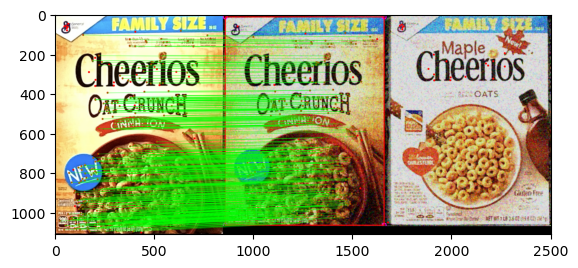

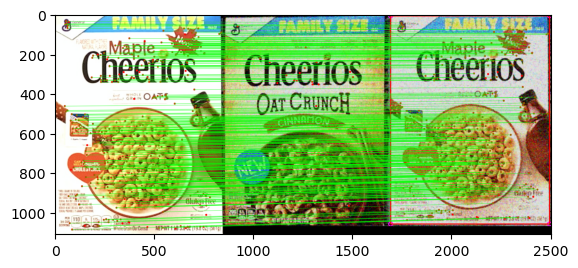

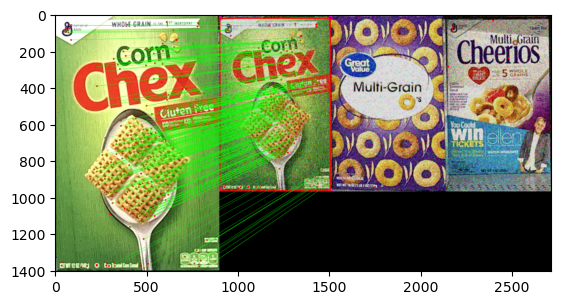

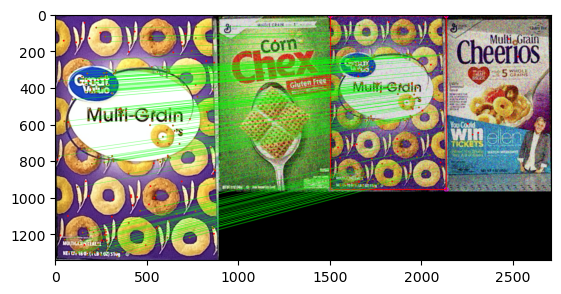

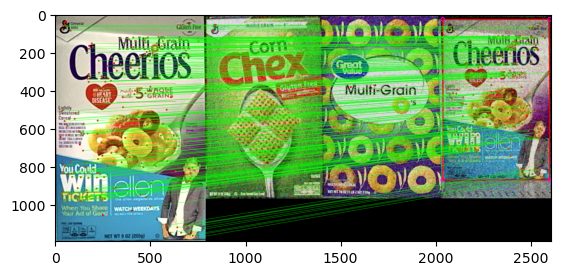

...

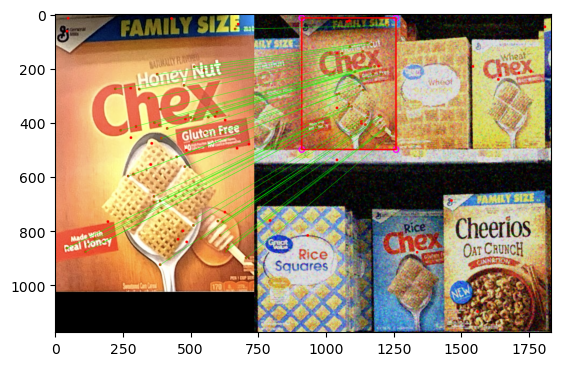

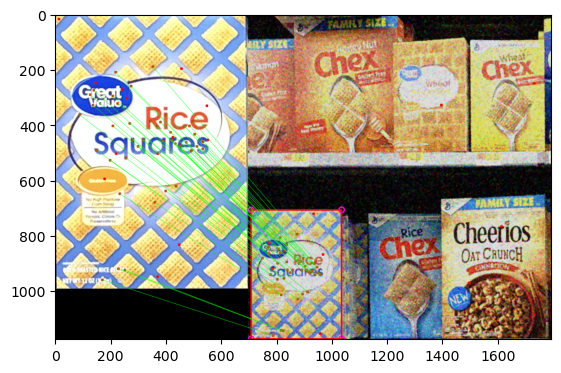

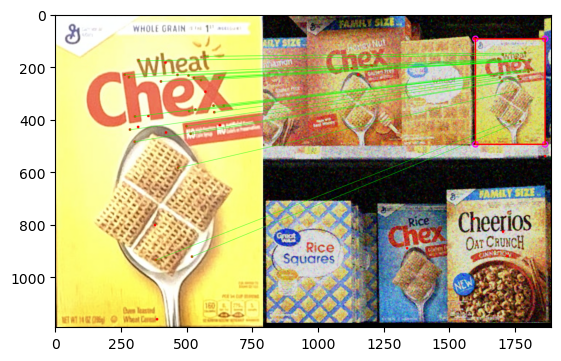

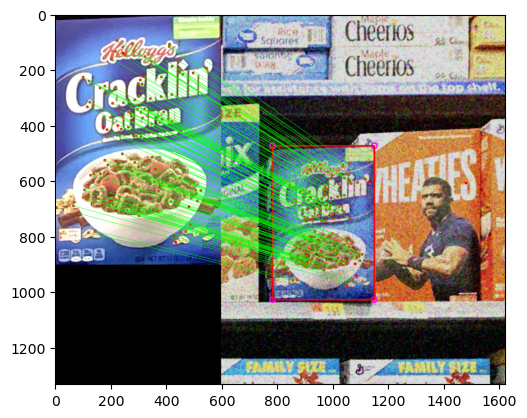

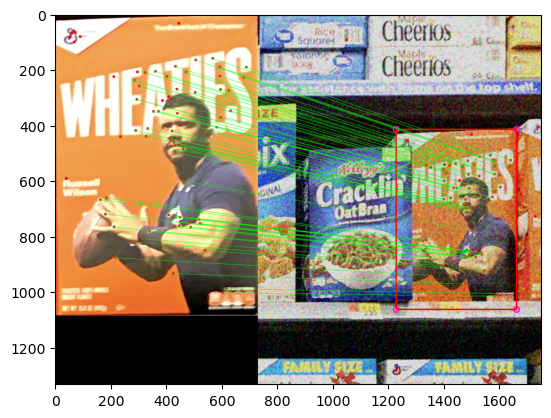

In [11]:
scenes_smoothed = {x:imageFilteringPipeline(y) for x,y in scenes.items()}

found = []
sid_results = {key: {} for key in sid_scenes}

for scene_key in sid_scenes:
    for model_key in sid_models:
        bb = match(models[model_key], scenes_smoothed[scene_key].copy(), min_score=50, color_thres=0.6, plot_matches=True)

        # build the result dictionary
        if (bb is not None) :
            found.append(bb)
            temp = sid_results[scene_key].get(model_key, ())
            if temp != ():
                count, bbs = temp
                bbs.append(bb)
                count += 1
                sid_results[scene_key][model_key] = (count, bbs)
            else:
                sid_results[scene_key][model_key] = (1, [bb])
        else :
            if model_key in single_instance_truths[scene_key]:
                print(f"{model_key} and {scene_key} SHOULD MATCH!!")

In [12]:
print_results(sid_results)

In scene 1
Product 1 - 1 instance found:
  Instance 1 {position: (11, 14), width: 803px, height: 1050px}
Product 2 - 1 instance found:
  Instance 1 {position: (846, 9), width: 803px, height: 1049px}


In scene 2
Product 3 - 1 instance found:
  Instance 1 {position: (3, 23), width: 605px, height: 941px}
Product 4 - 1 instance found:
  Instance 1 {position: (611, 9), width: 633px, height: 949px}
Product 5 - 1 instance found:
  Instance 1 {position: (1247, 28), width: 562px, height: 844px}


In scene 3
Product 6 - 1 instance found:
  Instance 1 {position: (0, 121), width: 599px, height: 669px}
Product 7 - 1 instance found:
  Instance 1 {position: (619, 136), width: 544px, height: 650px}
Product 8 - 1 instance found:
  Instance 1 {position: (1166, 8), width: 560px, height: 777px}


In scene 4
Product 1 - 1 instance found:
  Instance 1 {position: (699, 659), width: 376px, height: 510px}
Product 7 - 1 instance found:
  Instance 1 {position: (0, 107), width: 179px, height: 394px}
Product 8 - 

In Task A, we managed to achieve 100% accuracy, even detecting the partially occluded instance of 'ref6' in 'scene4'. This result was achieved after careful tuning of the thresholds and the filtering pipeline. Lowering the median filter kernel size from to 5 also contributed to finding more keypoints in more difficult templates, such as 'ref10'.

## Task B: Multiple instance detection

For task B, we needed to redesign some parts of the general algorithm found in task A, however as we will see the general idea largely remains the same.

We've decided to use **two different SIFT configurations** for the target image and the model image, in order to allow for more keypoints to be found in the former, by changing the contrast threshold and the edge threshold (which determine the minimum intensity difference and the minimum angle at which a keypoint is found respectively).

Throughout out this part, finding enough keypoints will be a major challenge as some instances have less pronounced details/edges.

In [13]:
sift_target = cv2.SIFT_create(contrastThreshold=0.001, edgeThreshold=10)
sift = cv2.SIFT_create()

The instance detection pipeline for task B is generally similar to the one found in task A, and works as follows:
1. We compute the SIFT keypoints in both the template and the target images. We then match the keypoints using a FLANN-based matcher.
2. We do a first filtering of the matching using the 'Lowe's test', which limits the number of false positives by checking if the distance of `m` is less than the distance of `n` multiplied by a threshold (Lowe's ratio), where `m` and `n` are 2 matched keypoints, and the distance is the distance between the keypoint on the target image and the respective one on the template.
3. We evaluate the color similarity of the patch around the matched keypoints (using the `match_color_histograms` function described before) and we add them to a list. We then compute a score based on the number of matches and the number of these matched keypoints that passed the color similarity test.
    - The score threshold is dynamically calculated based on the number of keypoints detected in the query image. This approach enhances the robustness of the algorithm and introduces a level of adaptability to account for the varying number of keypoints across different instances. By adjusting the threshold relative to the number of keypoints, the algorithm more effectively balances sensitivity and specificity.


4. If the score is high enough, we search for an homography and build a BB using the functions described before, if an homography is found, we divide it into sections and compare it with the template using `divide_and_compare_sections`. Afterwards, we store the sum of the two color similarity scores obtained from this step and the previous one respectively, and repeat the previous steps for all the other reference images.

5. After all the images have been processed, we find the template image with the maximum score and consider it as the match. Finally, the matched instance is "hidden" by setting the pixels of the found BB to the same color (e.g. white). In this way, the algorithm will simply ignore that section of the image on the next iteration, and will not consider it as a possible match.
    -  Summing the two similarity scores when considering the match allows to give importance to both the color in the details and the color in the rest of reference when considering a possible match in the final step. This in particular is effective for boxes of products that are a variation of another.

This is all implemented by the `match_B()` function.

Since we are effectively comparing the scores of each reference image w.r.t. to a target image, instead of a passing a single reference to the function, we pass a dictionary of all the reference image.

It's important to note that for this particular task, during the section-based color matching we discard the L coordinate when computing the score, in order for the procedure to be more invariant to intensity changes.

During the development of this phase, we've experimented with Brute Force Matching instead of a Flann-based matcher in the first key pointing filtering step. However, using this technique did not improve performance and increased execution time dramatically.

In [14]:
def match_B(models, buf_scene_image, display_scene_image, min_score=50, kp_dynamic_thresh=0.08, kp_color_thres=0.6, color_thres=0.7, draw_kp=True, plot_matches=True, verbose=True):
    """
    Performs the Multiple Instance detection pipeline described previously.

    params:
    - models: dictionary containing all the model images (with key=name and value=image)
    - buf_scene_image: target image used as a buffer for hiding the instances that have already been found.
    - display_scene_image: target image used to display the bounding box.
    - min_score: minimum score threshold for the first part of the pipeline.
    - kp_color_thres: threhsold for color matching for the keypoint patches.
    - color_thres: threshold for the second color matching the sections of the BB.
    - draw_kp, plot_matches, verbose: parameters dedicated for debugging.
    """
    random.seed(seed)
    np.random.seed(seed)
    cv2.setRNGSeed(seed)

    best_matches = {key: {} for key in models.keys()}
    kp_train, des_train = sift_target.detectAndCompute(buf_scene_image, None)

    for model_key, model_image in models.items():
        if verbose: print(f"Testing {model_key}")

        kp_query, des_query = sift.detectAndCompute(model_image, None)

        # use FLANN-based matcher to find matches
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=2)
        search_params = dict(checks=250)
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(des_query, des_train, k=2)

        # filter matches based on lowes ratio
        good_matches = []
        for m, n in matches:
            if m.distance < LOWES_RATIO * n.distance:
                good_matches.append(m)

        # soft color matching step
        filtered_matches = []
        kp_color_scores = []
        for match in good_matches:
            query_idx = match.queryIdx
            train_idx = match.trainIdx
            kp_q = kp_query[query_idx]
            kp_t = kp_train[train_idx]

            # extract patches around the keypoints
            patch_query = extract_patch(model_image, kp_q)
            patch_train = extract_patch(buf_scene_image, kp_t)

            # compare color histograms in LAB space of the extracted patches
            _, a_score, b_score = match_color_histograms(patch_query, patch_train)

            if a_score >= kp_color_thres and b_score >= kp_color_thres:
                filtered_matches.append(match)
                kp_color_scores.append((a_score + b_score)/2)

        score = len(good_matches) + 3*len(filtered_matches)
        if verbose:
            print(f"Got {len(good_matches)} matches, filtered to {len(filtered_matches)}. Total score is: {score}")
            print(f"DEBUG: SCORE {score} MMC {min_score}, kp_q: {len(kp_query)}")

        # Proceed if the first score is high enough
        if score >= min(min_score, int(kp_dynamic_thresh * len(kp_query))):
            # display scene image is the image used for not for computations, but only for showing the BBs
            image_to_display = display_scene_image.copy()
            bb, matches_mask = build_bb(model_image, image_to_display, kp_query, kp_train, good_matches, verbose=verbose)

            if bb is not None:
                # BB is now the ROI (region of interest)
                x, y, w, h = cv2.boundingRect(bb.astype(np.int32))
                roi = buf_scene_image[y:y+h, x:x+w]

                # divide image into sections
                rows, cols = 4, 4
                similarity_scores = divide_and_compare_sections(model_image, roi, rows, cols, bins=64)

                # compute the mean color score for the patch around the color matched keypoints
                kpcolorsnum = np.mean(kp_color_scores) if len(kp_color_scores) > 0 else 0
                # compute the mean color score for the sections of the bb
                avg_similarity = np.mean(similarity_scores)
                if avg_similarity > color_thres:
                    best_matches[model_key] = {'bb': (bb, matches_mask), 'color_score': avg_similarity+kpcolorsnum, 'kp': kp_query, 'matches': good_matches}

    highest_score_key = max(best_matches, key=lambda x: best_matches[x].get('color_score', 0))
    highest_score = best_matches[highest_score_key].get('color_score', 0)

    if highest_score > color_thres:
        # it's officially a match!
        bb, matches_mask = best_matches[highest_score_key].get('bb', 0)
        kp_query = best_matches[highest_score_key].get('kp', [])
        good_matches = best_matches[highest_score_key].get('matches', [])

        # turn pixels to a single color in the image buffer,
        # to hide it for multiple instance detection
        x, y, w, h = cv2.boundingRect(bb.astype(np.int32))
        buf_scene_image[:, x:x+w] = 255
        draw_bb(image_to_display, bb)

        # plotting part
        if plot_matches:
            draw_params = dict(matchColor=(0, 255, 0),  # draw matches in green color
                            singlePointColor=None,
                            matchesMask=matches_mask,  # draw only inliers (i.e. not kps outside bb)
                            flags=2)

            if draw_kp:
                _, image_to_display = draw_matched_keypoints(models[highest_score_key],
                                                image_to_display, kp_query, kp_train, good_matches)

                _ = draw_matches(image1=models[highest_score_key], keypoints1=kp_query, image2=image_to_display, keypoints2=kp_train,
                                            matches=good_matches)
                matched_image = cv2.drawMatches(models[highest_score_key], kp_query, image_to_display, kp_train, good_matches, None, **draw_params)
                plt.imshow(matched_image)
                plt.show()

        return (highest_score_key, cv2.boundingRect(bb.astype(np.int32)))
    else:
        return None


Given the references used for this task, we decided to **tune the parameters of the image filtering** pipeline. In particular:
- We've increased the size of the bilateral filter to have a more aggressive noise reduction.
- Increasing both $\sigma_C$ (the color space filter sigma) and $\sigma_S$ (the spatial filter sigma) leads to more uniform areas and stronger edges.

These parameters allows for images with finer details/colors that would otherwise be blended with the background to have a stronger influence during the matching phase, as well as reducing the number of false positives.

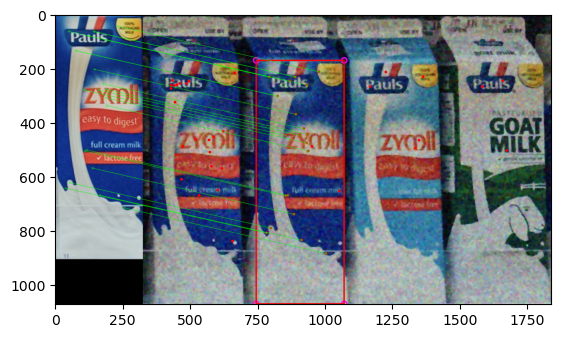

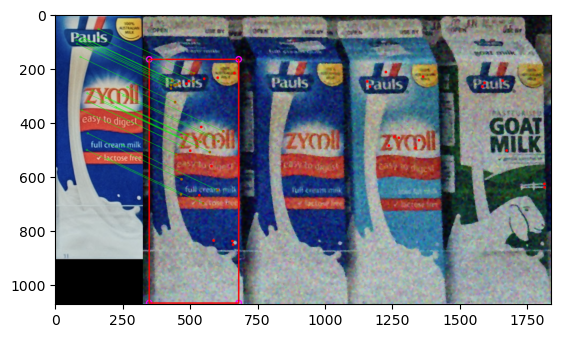

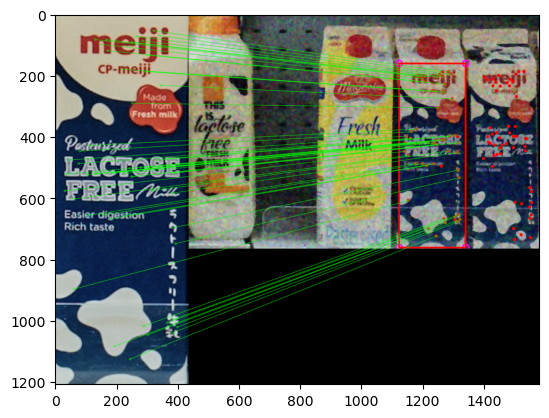

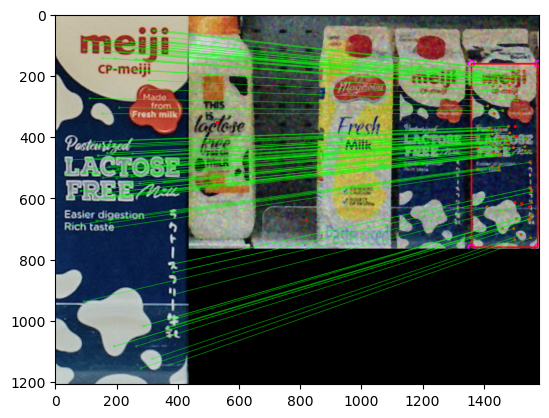

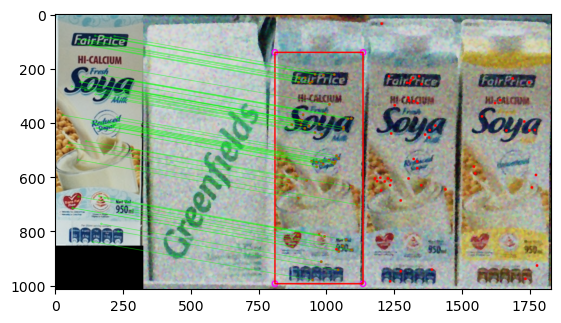

...

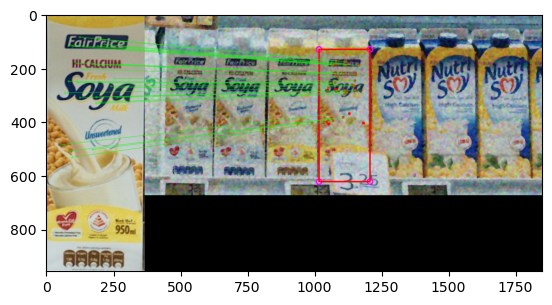

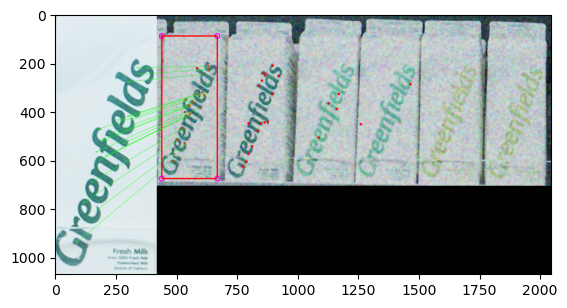

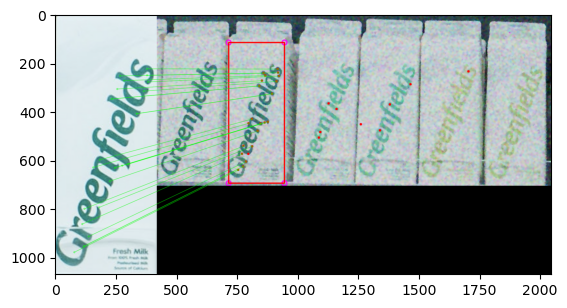

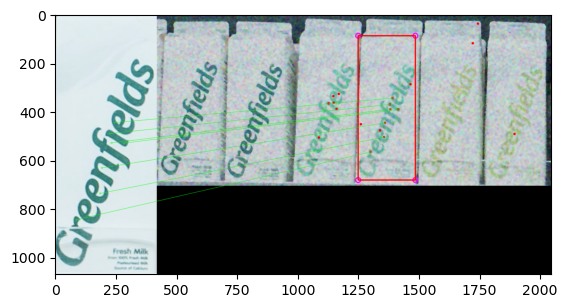

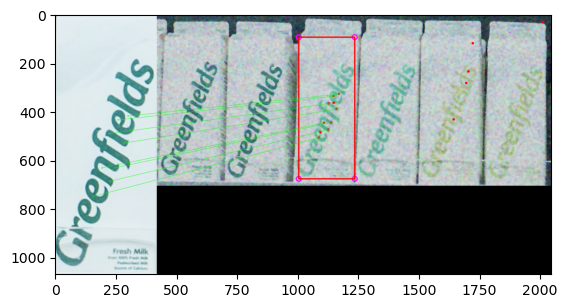

In [15]:
scenes_smoothed = {x:imageFilteringPipeline(y, median_size = 5, bilateral_size = 12, sigmaC = 70, sigmaS = 30) for x,y in scenes.items()}

mid_results = {key: {} for key in mid_scenes}
mid_dict = {key: models[key] for key in mid_models if key in models}

for scene_key in mid_scenes:
    buf_scene_image = scenes_smoothed[scene_key].copy()
    image_to_display = scenes_smoothed[scene_key].copy()
    out = ()

    while out is not None:
        out = match_B(mid_dict, buf_scene_image, image_to_display, min_score=10, color_thres=0.55, plot_matches=True, verbose=False)
        if (out is not None) :
            product_key, bb = out
            found.append(bb)
            temp = mid_results[scene_key].get(product_key, ())
            if temp != ():
                count, bbs = temp
                bbs.append(bb)
                count += 1
                mid_results[scene_key][product_key] = (count, bbs)
            else:
                mid_results[scene_key][product_key] = (1, [bb])


In [16]:
print_results(mid_results)

In scene 6
Product 15 - 2 instance found:
  Instance 1 {position: (420, 168), width: 327px, height: 904px}
  Instance 2 {position: (23, 164), width: 333px, height: 905px}


In scene 7
Product 16 - 2 instance found:
  Instance 1 {position: (686, 161), width: 218px, height: 602px}
  Instance 2 {position: (922, 162), width: 217px, height: 600px}


In scene 8
Product 17 - 2 instance found:
  Instance 1 {position: (485, 141), width: 326px, height: 854px}
  Instance 2 {position: (825, 149), width: 328px, height: 854px}
Product 24 - 1 instance found:
  Instance 1 {position: (1174, 153), width: 327px, height: 853px}
Product 27 - 1 instance found:
  Instance 1 {position: (104, 199), width: 320px, height: 754px}


In scene 9
Product 20 - 2 instance found:
  Instance 1 {position: (1249, 100), width: 227px, height: 558px}
  Instance 2 {position: (991, 90), width: 218px, height: 484px}
Product 19 - 2 instance found:
  Instance 1 {position: (509, 94), width: 224px, height: 558px}
  Instance 2 {posit

In Task B, we achieve pretty good performance. However, the algorithm still has problems catching the "Greenfield" instances, in particular the ones associated with templates "ref26", "ref27", "ref18". Specifically, ref27 is mistakenly detected as ref26 or viceversa. This is due to the fact that the section of the image representing the brand of these products, which is also the part denser with keypoints, has the same chromatic information, albeit at a different intensity. Even if the LAB color space is employed, which should at least provide some aid in this situation due to its separate L coordinate, the distance between the color histograms remains too close for the algorithm to detect and discern the 2 instances.

On the other hand, "ref18" causes issues w.r.t. keypoint the detection in both the template and the target image. It is the instance with the lowest amount of keypoints found in the template thus far (around 80 kp), and the color of its brand easily blends with the background.

During testing, we've noticed how much the image filtering parameters influenced the performance of the algorithm:
- Regarding the median filter, a smaller kernel size preserved more fine details in the image, allowing for the 'Greenfield' instances to accurately be recognized in some cases. However at the same time it lead to insane BBs in the instances with clearer colors (e.g. scene10), thus causing the instances to not be detected properly.
- Similarly, tuning the $\sigma$ parameters of the bilateral filter also impacted the results: increasing these parameters initially seemed to result in a visually sharper and less noisy image. However, this adjustment adversely affected the performance of the SIFT and FLANN algorithms, leading to poorer feature matching. Conversely, the color matching improved slightly with the increased $\sigma$ values.

Ultimately, we decided to maintain the parameters that lead to the best general performance of the algorithm.

To better understand these effects, an example is presented in the Appendix.

-----

## Appendix

In this appendix, we'd like to show a set of parameters that allows for 'scene12' to recognize most of the instances correctly.

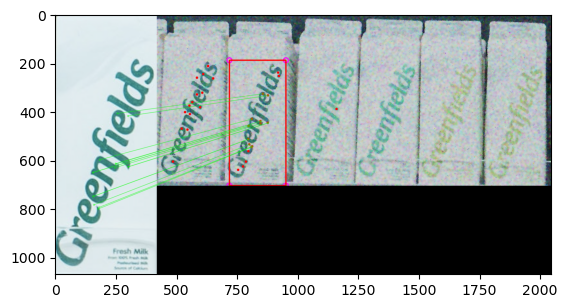

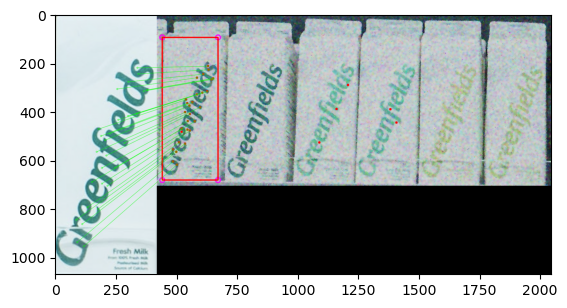

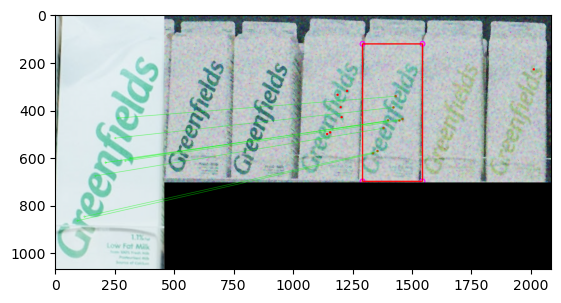

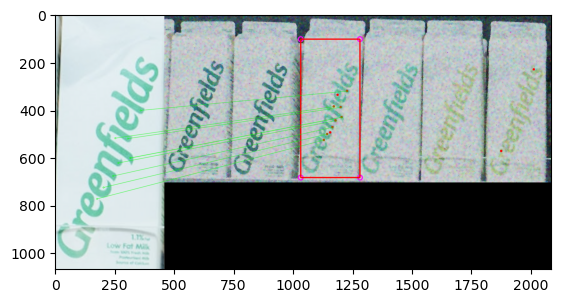

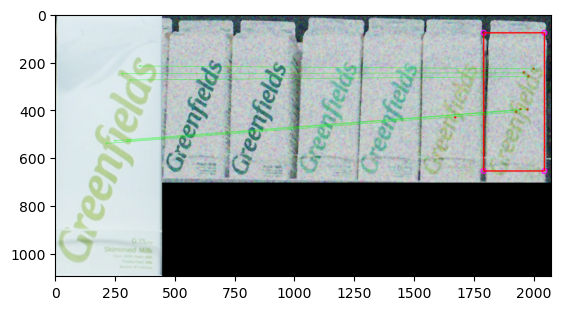

In [17]:
scenes_smoothed = {x:imageFilteringPipeline(y, median_size = 3, bilateral_size = 12, sigmaC = 100, sigmaS = 30) for x,y in scenes.items()}

mid_results = {key: {} for key in ['scene12']}
mid_dict = {key: models[key] for key in mid_models if key in models}


scene_key = 'scene12'
buf_scene_image = scenes_smoothed[scene_key].copy()
image_to_display = scenes_smoothed[scene_key].copy()
out = ()

while out is not None:
    out = match_B(mid_dict, buf_scene_image, image_to_display, min_score=10, color_thres=0.55, plot_matches=True, verbose=False)
    if (out is not None) :
        product_key, bb = out
        found.append(bb)
        temp = mid_results[scene_key].get(product_key, ())
        if temp != ():
            count, bbs = temp
            bbs.append(bb)
            count += 1
            mid_results[scene_key][product_key] = (count, bbs)
        else:
            mid_results[scene_key][product_key] = (1, [bb])


In [18]:
print_results(mid_results)

In scene 12
Product 26 - 2 instance found:
  Instance 1 {position: (299, 186), width: 234px, height: 518px}
  Instance 2 {position: (22, 92), width: 231px, height: 589px}
Product 27 - 2 instance found:
  Instance 1 {position: (833, 121), width: 253px, height: 579px}
  Instance 2 {position: (573, 101), width: 250px, height: 583px}
Product 18 - 1 instance found:
  Instance 1 {position: (1344, 78), width: 255px, height: 578px}




The new parameters greatly improve instance detection in this particular scene. However, in other scenes they introduced a great amount of false positives and malformed BBs, specifically 'scene10'. Unfortunately, we did not manage to find a 'one-size fits all' set of parameters that would yield great result in all instances; therefore we ultimately decided to use the set of parameters used on the previous paragraph, which were the ones that provided generally the best results.